### Problem Statement:
Create a Recommender System to show personalized movie recommendations based on ratings given by a user and other users similar to them in order to improve user experience.

### Data Description:

#### RATINGS FILE DESCRIPTION
================================================================================

All ratings are contained in the file "ratings.dat" and are in the
following format:

UserID::MovieID::Rating::Timestamp

- UserIDs range between 1 and 6040
- MovieIDs range between 1 and 3952
- Ratings are made on a 5-star scale (whole-star ratings only)
- Timestamp is represented in seconds
- Each user has at least 20 ratings

#### USERS FILE DESCRIPTION
================================================================================

User information is in the file "users.dat" and is in the following
format:

UserID::Gender::Age::Occupation::Zip-code

All demographic information is provided voluntarily by the users and is
not checked for accuracy.  
Only users who have provided some demographic
information are included in this data set.

- Gender is denoted by a "M" for male and "F" for female
- Age is chosen from the following ranges:

	*  1:  "Under 18"
	* 18:  "18-24"
	* 25:  "25-34"
	* 35:  "35-44"
	* 45:  "45-49"
	* 50:  "50-55"
	* 56:  "56+"

- Occupation is chosen from the following choices:

	*  0:  "other" or not specified
	*  1:  "academic/educator"
	*  2:  "artist"
	*  3:  "clerical/admin"
	*  4:  "college/grad student"
	*  5:  "customer service"
	*  6:  "doctor/health care"
	*  7:  "executive/managerial"
	*  8:  "farmer"
	*  9:  "homemaker"
	* 10:  "K-12 student"
	* 11:  "lawyer"
	* 12:  "programmer"
	* 13:  "retired"
	* 14:  "sales/marketing"
	* 15:  "scientist"
	* 16:  "self-employed"
	* 17:  "technician/engineer"
	* 18:  "tradesman/craftsman"
	* 19:  "unemployed"
	* 20:  "writer"

#### MOVIES FILE DESCRIPTION
================================================================================

Movie information is in the file "movies.dat" and is in the following
format:

MovieID::Title::Genres

- Titles are identical to titles provided by the IMDB (including
year of release)
- Genres are pipe-separated and are selected from the following genres:

	* Action
	* Adventure
	* Animation
	* Children's
	* Comedy
	* Crime
	* Documentary
	* Drama
	* Fantasy
	* Film-Noir
	* Horror
	* Musical
	* Mystery
	* Romance
	* Sci-Fi
	* Thriller
	* War
	* Western

### Our Approach:

In this project, we'll be building a recommender system that is going to recommend movies to a user based on their preferences as well as the choices of other users who are similar to them.

#### **What is a Recommender System?**

A recommender engine, or a recommendation system is a subclass of information filtering system that seeks to predict the "rating" or "preference" a user would give to an item.

#### **Types of Recommender Systems -**

Recommender systems usually make use of either or both *Collaborative Filtering* and *Content-based Filtering* techniques.

#### **Collaborative Filtering**

Collaborative filtering is based on the assumption that people who agreed in the past will agree in the future, and that they will like similar kinds of items as they liked in the past. The system generates recommendations using only information about rating profiles for different users or items. By locating peer users/items with a rating history similar to the current user or item, they generate recommendations using this neighborhood.

#### **Content-based Filtering**

Content-based filtering methods are based on a description of the item and a profile of the user's preferences. These methods are best suited to situations where there is known data on an item (name, location, description, etc.), but not on the user. Content-based recommenders treat recommendation as a user-specific classification problem and learn a classifier for the user's likes and dislikes based on an item's features.

### Importing required libraries -

In [4]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import sparse
from scipy.stats import pearsonr
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
import warnings
import keras
from tensorflow.keras.optimizers import Adam
from keras.layers import Input, Embedding, Flatten
from keras.layers import dot
from pylab import rcParams

ModuleNotFoundError: No module named 'matplotlib.backends.registry'

### Configuring the notebook -

In [4]:
warnings.simplefilter('ignore')
pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:.2f}'.format
sns.set_style('white')

### Reading the data files -

In [8]:
movies = pd.read_fwf('./input/zeemovie/movies.dat', encoding='ISO-8859-1')
ratings = pd.read_fwf('./input/zeemovie/ratings.dat', encoding='ISO-8859-1')
users = pd.read_fwf('./input/zeemovie/users.dat', encoding='ISO-8859-1')

### Data Formatting -

In [9]:
movies.head()

,Movie ID::Title::Genres,Unnamed: 1,Unnamed: 2
0,1::Toy Story (1995)::Animation|Children's|Comedy,NaN,NaN
1,2::Jumanji (1995)::Adventure|Children's|Fantasy,NaN,NaN
2,3::Grumpier Old Men (1995)::Comedy|Romance,NaN,NaN
3,4::Waiting to Exhale (1995)::Comedy|Drama,NaN,NaN
4,5::Father of the Bride Part II (1995)::Comedy,NaN,NaN


In [10]:
movies.drop(columns=['Unnamed: 1', 'Unnamed: 2'], axis=1, inplace=True)

In [11]:
delimiter = '::'
movies = movies['Movie ID::Title::Genres'].str.split(delimiter, expand=True)
# here expand=True will create a dataframe instead of a series
movies.columns = ['Movie ID', 'Title', 'Genres']

In [12]:
movies.rename(columns={'Movie ID':'MovieID'}, inplace=True)

In [13]:
movies.sample(5)

,MovieID,Title,Genres
3109,3178,"Hurricane, The (1999)",Drama
605,609,Homeward Bound II: Lost in San Francisco (1996),Adventure|Childre
2304,2373,Red Sonja (1985),Action|Adventure
3471,3540,Passion of Mind (1999),Romance|Thriller
2695,2764,"Thomas Crown Affair, The (1968)",Crime|Drama|Thriller


In [14]:
ratings = ratings['UserID::MovieID::Rating::Timestamp'].str.split(delimiter, expand=True)
ratings.columns = ['UserID', 'MovieID', 'Rating', 'Timestamp']

In [15]:
ratings.head()

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


In [16]:
users = users['UserID::Gender::Age::Occupation::Zip-code'].str.split(delimiter, expand=True)
users.columns = ['UserID', 'Gender', 'Age', 'Occupation', 'Zip-code']

In [17]:
users.replace({'Age':{'1':  "Under 18",
                      '18':  "18-24",
                      '25':  "25-34",
                      '35':  "35-44",
                      '45':  "45-49",
                      '50':  "50-55",
                      '56':  "56 Above"}}, inplace=True)

In [18]:
users.replace({'Occupation':{'0': "other",
                             '1': "academic/educator",
                             '2': "artist",
                             '3': "clerical/admin",
                             '4': "college/grad student",
                             '5': "customer service",
                             '6': "doctor/health care",
                             '7': "executive/managerial",
                             '8': "farmer",
                             '9': "homemaker",
                             '10': "k-12 student",
                             '11': "lawyer",
                             '12': "programmer",
                             '13': "retired",
                             '14': "sales/marketing",
                             '15': "scientist",
                             '16': "self-employed",
                             '17': "technician/engineer",
                             '18': "tradesman/craftsman",
                             '19': "unemployed",
                             '20': "writer"}}, inplace=True)

In [19]:
users.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,Under 18,k-12 student,48067
1,2,M,56 Above,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


### Merging the dataframes -

In [20]:
df_1 = pd.merge(movies, ratings, how='inner', on='MovieID')
df_1.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,978824268
1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,978237008
2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,978233496
3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,978225952
4,1,Toy Story (1995),Animation|Children's|Comedy,10,5,978226474


In [21]:
df_2 = pd.merge(df_1, users, how='inner', on='UserID')
df_2.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,978824268,F,Under 18,k-12 student,48067
1,48,Pocahontas (1995),Animation|Children's|Musical|Romance,1,5,978824351,F,Under 18,k-12 student,48067
2,150,Apollo 13 (1995),Drama,1,5,978301777,F,Under 18,k-12 student,48067
3,260,Star Wars: Episode IV - A New Hope (1977),Action|Adventure|Fantas,1,4,978300760,F,Under 18,k-12 student,48067
4,527,Schindler's List (1993),Drama|War,1,5,978824195,F,Under 18,k-12 student,48067


In [22]:
data = df_2.copy(deep=True)
data.sample(10)

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code
45567,1211,Wings of Desire (Der Himmel über Berlin) (1987),Comedy|Drama|Rom,549,5,976118386,M,25-34,doctor/health care,53217
12842,1247,"Graduate, The (1967)",Drama|Romance,169,5,977196893,M,25-34,executive/managerial,55439
67331,852,Tin Cup (1996),Comedy|Romance,757,3,975454666,M,25-34,programmer,97401
44742,2006,"Mask of Zorro, The (1998)",Action|Adventure|Romance,543,5,976121494,M,25-34,customer service,55057
17992,2539,Analyze This (1999),Comedy,214,4,976900941,M,18-24,writer,80218
107766,318,"Shawshank Redemption, The (1994)",Drama,59,3,977934038,F,50-55,academic/educator,55413
69972,1881,Quest for Camelot (1998),Adventure|Animation|Children's|Fantasy,780,3,975436172,M,25-34,technician/engineer,91776
78231,1834,"Spanish Prisoner, The (1997)",Drama|Thriller,127,3,988496394,F,45-49,clerical/admin,01770
21678,588,Aladdin (1992),Animation|Children's|Comedy|Musical,273,3,976775054,M,18-24,college/grad student,55427
128073,3717,Gone in 60 Seconds (2000),Action|Crime,650,4,981996393,M,25-34,technician/engineer,49445


### Performing EDA -

Shape of the dataset -

In [23]:
print("No. of rows: ", data.shape[0])
print("No. of columns: ", data.shape[1])

No. of rows:  132968
No. of columns:  10


In [24]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 132968 entries, 0 to 132967
Data columns (total 10 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   MovieID     132968 non-null  object
 1   Title       132968 non-null  object
 2   Genres      132493 non-null  object
 3   UserID      132968 non-null  object
 4   Rating      132968 non-null  object
 5   Timestamp   132967 non-null  object
 6   Gender      132968 non-null  object
 7   Age         132968 non-null  object
 8   Occupation  132968 non-null  object
 9   Zip-code    132968 non-null  object
dtypes: object(10)
memory usage: 11.2+ MB


### Feature Engineering -

In [26]:
data['Rating'].unique()

array(['5', '4', '3', '2', '1', '5:'], dtype=object)

In [29]:
data.replace({'Rating':{'5:':'5'}}, inplace=True)

In [30]:
data['Rating'] = data['Rating'].astype('int32')

In [31]:
data['Datetime'] = pd.to_datetime(data['Timestamp'],
                                  unit='s')

In [32]:
data['ReleaseYear'] = data['Title'].str.rsplit(' ', 1).str[1] #rsplit will split the string from right side, so rsplit(' ', 1) will split the string from right side and will return the last word
data['ReleaseYear'] = data['ReleaseYear'].str.lstrip("(").str.rstrip(")")

In [33]:
data['ReleaseYear'].unique()

array(['1995', '1977', '1993', '1992', '1937', '1991', '1996', '1964',
       '1939', '1958', '1950', '1941', '1965', '1982', '1975', '1987',
       '1962', '1989', '1985', '1959', '1997', '1998', '1988', '1942',
       '1947', '1999', '1980', '1983', '1986', '1990', '2000', '1964):',
       '1994', '1978', '1961', '1984', '1972', '1976', '1981', '1973',
       '1974', '1940', 'Bo', '1952', '1954', '1953', '1944', '1968',
       '1957', '1946', '1949', '1951', '1963', '1971', '1979', '1967',
       '1966', '1948', '1933', '1970', '1969', '1930', '1955', '1956', '',
       '1920', '1925', '1938', '195', '1960', '1935', '1932', '1931',
       '1945', '1943', '1981):', '1934', '1936', '1929', 'the', '1926',
       'Arta', 'B', '1927', '19', '1922', 'Polar', '1919', '1921', "d'A",
       '1923', '1989):', '1928'], dtype=object)

In [34]:
data['ReleaseYear'].replace(['1964):', '1981):', '1989):', '1995):'],
                            ['1964', '1981', '1989', '1995'], inplace=True)

In [35]:
idx_val = data[(data['ReleaseYear']=='Bo') |
               (data['ReleaseYear']=='195') |
               (data['ReleaseYear']=='') |
               (data['ReleaseYear']=='the') |
               (data['ReleaseYear']=='Arta') |
               (data['ReleaseYear']=='B') |
               (data['ReleaseYear']=='19') |
               (data['ReleaseYear']=='Polar') |
               (data['ReleaseYear']=="d'A") |
               (data['ReleaseYear']=='prendront') |
               (data['ReleaseYear']=='1')].index
data.drop(index=idx_val, inplace=True)

In [36]:
data['ReleaseYear'] = data['ReleaseYear'].astype('int32')

In [37]:
data['Title'] = data['Title'].str.rsplit(' ', 1).str[0]

In [38]:
bins = [1919, 1929, 1939, 1949, 1959, 1969, 1979, 1989, 2000]
labels = ['20s', '30s', '40s', '50s', '60s', '70s', '80s', '90s']
data['ReleaseDec'] = pd.cut(data['ReleaseYear'], bins=bins, labels=labels)

In [39]:
data.sample(5)

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime,ReleaseYear,ReleaseDec
44230,1148,"Wrong Trousers, The",Animation|Comedy,541,3,976124683,F,18-24,college/grad student,5849574,2000-12-06 17:44:43,1993,90s
60273,1676,Starship Troopers,Action|Adventure|Sci-Fi|War,710,3,975541809,M,25-34,writer,85207,2000-11-29 23:50:09,1997,90s
33349,910,Some Like It Hot,Comedy|Crime,412,4,976294038,M,35-44,scientist,55117,2000-12-08 16:47:18,1959,50s
724,3252,Scent of a Woman,Drama,10,3,978228727,F,35-44,academic/educator,95370,2000-12-31 02:12:07,1992,90s
52030,3398,"Muppets Take Manhattan, The",Children's|Comedy,629,3,975784137,F,Under 18,k-12 student,48154,2000-12-02 19:08:57,1984,80s


### Data Cleaning -

Checking for null values -

In [40]:
data.isna().sum()

MovieID          0
Title            0
Genres         184
UserID           0
Rating           0
Timestamp        1
Gender           0
Age              0
Occupation       0
Zip-code         0
Datetime         1
ReleaseYear      0
ReleaseDec       4
dtype: int64

Checking for duplicate rows -

In [41]:
duplicate_rows = data[data.duplicated()]
print("No. of duplicate rows: ", duplicate_rows.shape[0])

No. of duplicate rows:  0


### Data Visualization -

#### **Distribution of Movie Ratings -**

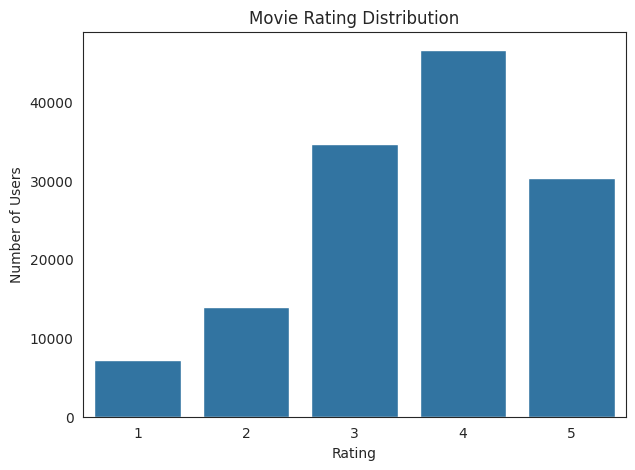

In [42]:
plt.figure(figsize=(7, 5))
sns.countplot(x='Rating', data=data)
plt.title('Movie Rating Distribution')
plt.xlabel('Rating')
plt.ylabel('Number of Users')
plt.show()

#### **Distribution by Age -**

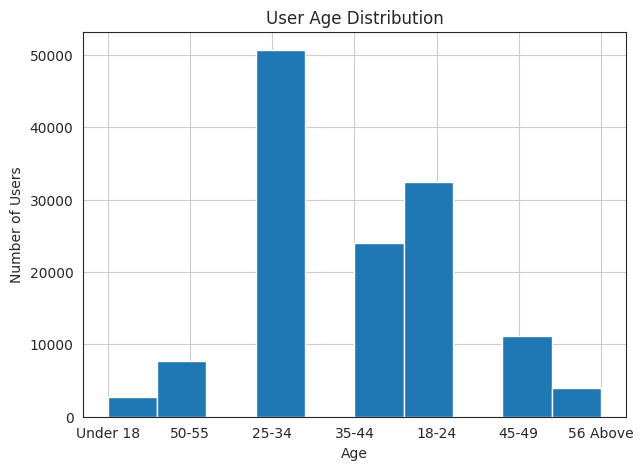

In [43]:
data['Age'].hist(figsize=(7, 5))
plt.title('User Age Distribution')
plt.xlabel('Age')
plt.ylabel('Number of Users')
plt.show()

#### **Distribution by Gender -**

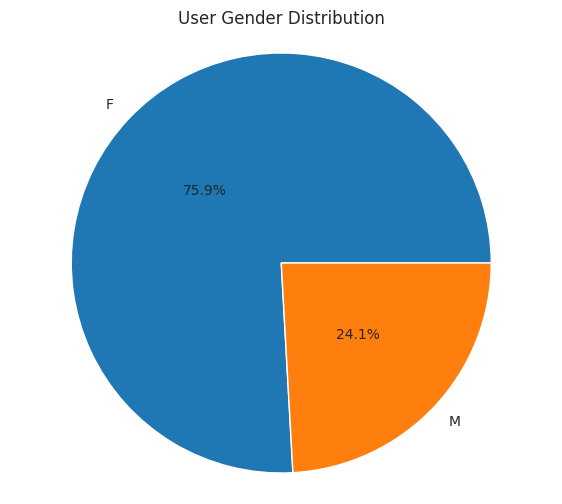

M    100682
F     31995
Name: Gender, dtype: int64

In [44]:
x = data['Gender'].value_counts().values
plt.figure(figsize=(7, 6))
plt.pie(x, center=(0, 0), radius=1.5, labels=data['Gender'].unique(), autopct='%1.1f%%', pctdistance=0.5)
plt.title('User Gender Distribution')
plt.axis('equal')
plt.show()
data['Gender'].value_counts()

#### **Distribution by Occupation -**

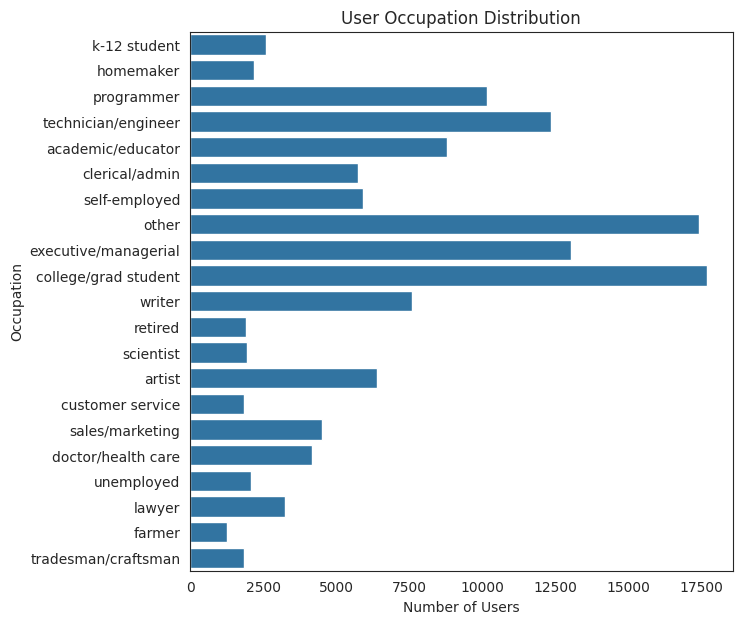

In [45]:
plt.figure(figsize=(7, 7))
sns.countplot(y='Occupation', data=data)
plt.title('User Occupation Distribution')
plt.xlabel('Number of Users')
plt.ylabel('Occupation')
plt.show()

#### **Distribution by Release Year -**

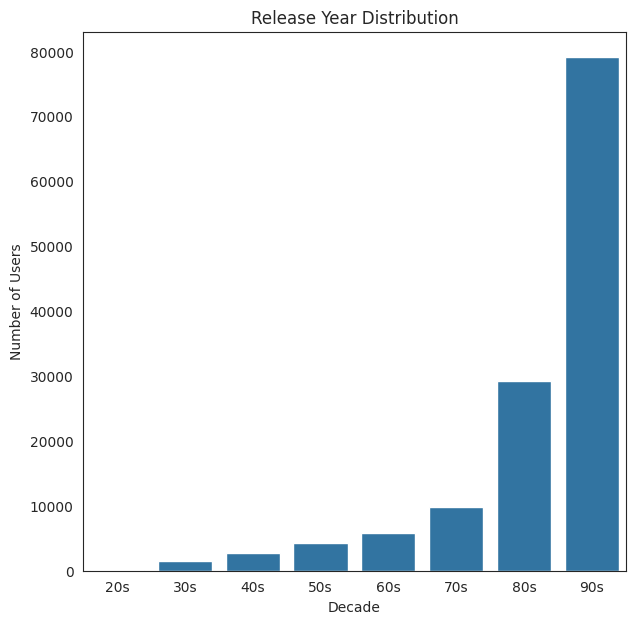

In [46]:
plt.figure(figsize=(7, 7))
sns.countplot(x='ReleaseDec', data=data)
plt.title('Release Year Distribution')
plt.xlabel('Decade')
plt.ylabel('Number of Users')
plt.show()

### Grouping the data -

#### **Average rating -**

In [47]:
data.groupby('Title')['Rating'].mean().sort_values(ascending=False).head(10)

Title
Eighth Day, The (Le Huitième jour )      5.00
Hearts and Minds                         5.00
West Beirut (West Beyrouth)              5.00
Lodger, The                              5.00
Autumn Sonata (Höstsonaten )             5.00
Whatever Happened to Aunt Alice?         5.00
Jupiter's Wife                           5.00
Time of the Gypsies (Dom za vesanje)     5.00
Vagabond (Sans toit ni loi)              5.00
Criminal Lovers (Les Amants Criminels)   5.00
Name: Rating, dtype: float64

#### **No. of ratings -**

In [48]:
data.groupby('Title')['Rating'].count().sort_values(ascending=False).head(10)

Title
American Beauty                                   510
Star Wars: Episode V - The Empire Strikes Back    432
Star Wars: Episode VI - Return of the Jedi        422
Star Wars: Episode IV - A New Hope                417
Jurassic Park                                     410
Matrix, The                                       385
Saving Private Ryan                               376
Terminator 2: Judgment Day                        374
Men in Black                                      365
Raiders of the Lost Ark                           361
Name: Rating, dtype: int64

In [49]:
df = pd.DataFrame(data.groupby('Title')['Rating'].agg([('Avg rating', 'mean')]))
df['No. of ratings'] = pd.DataFrame(data.groupby('Title')['Rating'].count())

In [50]:
df.sample(10)

,Avg rating,No. of ratings
Title,,
Scream,3.73,108
Bambi,3.84,79
Double Happiness,4.00,5
"Way of the Gun, The",3.19,31
Joe Gould's Secret,3.09,11
Until the End of the World (Bis ans Ende der Welt),3.74,19
Overnight Delivery,1.50,2
"Fish Called Wanda, A",3.89,163
Live Flesh,4.50,2


In our case, we'll be working on a Collaborative Filtering Recommender System.

Collaborative filtering methods are classified as *memory-based* and *model-based*.

Also there are two approaches to this method. A *user-based* approach and an *item-based* approach.

### Pivot Table -

Creating a pivot table of movie titles and userid -

In [51]:
mat = pd.pivot_table(data, index='UserID', columns='Title', values='Rating', aggfunc='mean')
mat.head(10)

Title   $1,000,000 Duck  'Night Mother  'Til There Was You  'burbs, The  \
UserID                                                                    
1                   NaN            NaN                 NaN          NaN   
10                  NaN            NaN                 NaN         4.00   
100                 NaN            NaN                 NaN          NaN   
101                 NaN            NaN                 NaN          NaN   
102                 NaN            NaN                 NaN          NaN   
103                 NaN            NaN                 NaN          NaN   
104                 NaN            NaN                 NaN          NaN   
105                 NaN            NaN                 NaN          NaN   
106                 NaN            NaN                 NaN          NaN   
107                 NaN            NaN                 NaN          NaN   

Title   ...And Justice for All  10 Things I Hate About You  101 Dalmatians  \
UserID                                                                       
1                          NaN                         NaN             NaN   
10                         NaN                         NaN             NaN   
100                        NaN                         NaN             NaN   
101                        NaN                         NaN             NaN   
102                        NaN                         NaN             NaN   
103                        NaN                         NaN             NaN   
104                        NaN                         NaN             NaN   
105                        NaN                         NaN             NaN   
106                        NaN                         NaN             NaN   
107                        NaN                         NaN             NaN   

Title   12 Angry Men  13th Warrior, The  187  2 Days in the Valley  20 Dates  \
UserID                                                                         
1                NaN                NaN  NaN                   NaN       NaN   
10              3.00               4.00  NaN                   NaN       NaN   
100              NaN                NaN  NaN                   NaN       NaN   
101              NaN               4.00  NaN                   NaN       NaN   
102              NaN                NaN  NaN                   NaN       NaN   
103              NaN               4.00  NaN                   NaN       NaN   
104              NaN               5.00  NaN                   NaN       NaN   
105              NaN                NaN  NaN                   NaN       NaN   
106              NaN                NaN  NaN                   NaN       NaN   
107             4.00                NaN  NaN                   NaN       NaN   

Title   20,000 Leagues Under the Sea  200 Cigarettes  2001: A Space Odyssey  \
UserID                                                                        
1                                NaN             NaN                    NaN   
10                              4.00             NaN                   3.00   
100                              NaN             NaN                   4.00   
101                              NaN             NaN                    NaN   
102                              NaN             NaN                   1.00   
103                              NaN             NaN                    NaN   
104                              NaN             NaN                    NaN   
105                              NaN             NaN                    NaN   
106                              NaN             NaN                    NaN   
107                              NaN             NaN                   5.00   

Title   2010  24-hour Woman  28 Days  3 Ninjas: High Noon On Mega Mountain  \
UserID                                                                       
1        NaN            NaN      NaN                                   NaN   
10       NaN      

Imputing 'NaN' values with Zero rating -

In [52]:
mat.fillna(0, inplace=True)

In [53]:
mat.shape

(858, 3294)

### Pearson Correlation -

Correlation is a measure that tells how closely two variables move in the same or opposite direction. A positive value indicates that they move in the same direction (i.e. if one increases other increases), where as a negative value indicates the opposite.

The most popular correlation measure for numerical data is Pearson’s Correlation. This measures
the degree of linear relationship between two numeric variables and lies between -1 to +1. It is
represented by ‘r’.

* r=1 means perfect positive correlation
* r=-1 means perfect negative correlation
* r=0 means no linear correlation (note, it does not mean no correlation)


#### **Item-based approach:**

We will take a movie name as an input from the user and see which other 5 (five) movies have maximum correlation with it.

In [54]:
movie_name = input("Enter a movie name: ")
movie_rating = mat[movie_name]

Enter a movie name: Liar Liar


In [55]:
similar_movies = mat.corrwith(movie_rating)

In [56]:
sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True)

In [57]:
sim_df.iloc[1: , :].head()

,Correlation
Title,
Mrs. Doubtfire,0.51
Dumb & Dumber,0.49
"Wedding Singer, The",0.46
Home Alone,0.45
Robin Hood: Men in Tights,0.44


### Cosine Similarity -

Cosine similarity is a measure of similarity between two sequences of numbers. Those sequences are viewed as vectors in a higher dimensional space, and the cosine similarity is defined as the cosine of the angle between them, i.e. the dot product of the vectors divided by the product of their lengths.

The cosine similarity always belongs to the interval [-1,1]. For example, two proportional vectors have a cosine similarity of 1, two orthogonal vectors have a similarity of 0, and two opposite vectors have a similarity of -1.

In [58]:
item_sim = cosine_similarity(mat.T)
item_sim

array([[1.        , 0.        , 0.        , ..., 0.        , 0.03566315,
        0.        ],
       [0.        , 1.        , 0.        , ..., 0.09148553, 0.        ,
        0.02009621],
       [0.        , 0.        , 1.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.09148553, 0.        , ..., 1.        , 0.        ,
        0.18936677],
       [0.03566315, 0.        , 0.        , ..., 0.        , 1.        ,
        0.21794266],
       [0.        , 0.02009621, 0.        , ..., 0.18936677, 0.21794266,
        1.        ]])

#### **Item similarity matrix -**

In [59]:
item_sim_mat = pd.DataFrame(item_sim, index=mat.columns, columns=mat.columns)
item_sim_mat.head()

Title                   $1,000,000 Duck  'Night Mother  'Til There Was You  \
Title                                                                        
$1,000,000 Duck                    1.00           0.00                0.00   
'Night Mother                      0.00           1.00                0.00   
'Til There Was You                 0.00           0.00                1.00   
'burbs, The                        0.00           0.00                0.09   
...And Justice for All             0.00           0.02                0.00   

Title                   'burbs, The  ...And Justice for All  \
Title                                                         
$1,000,000 Duck                0.00                    0.00   
'Night Mother                  0.00                    0.02   
'Til There Was You             0.09                    0.00   
'burbs, The                    1.00                    0.12   
...And Justice for All         0.12                    1.00   

Title                   10 Things I Hate About You  101 Dalmatians  \
Title                                                                
$1,000,000 Duck                               0.09            0.18   
'Night Mother                                 0.02            0.12   
'Til There Was You                            0.10            0.14   
'burbs, The                                   0.21            0.22   
...And Justice for All                        0.09            0.18   

Title                   12 Angry Men  13th Warrior, The  187  \
Title                                                          
$1,000,000 Duck                 0.03               0.07 0.00   
'Night Mother                   0.00               0.01 0.00   
'Til There Was You              0.16               0.03 0.00   
'burbs, The                     0.20               0.24 0.19   
...And Justice for All          0.26               0.08 0.16   

Title                   2 Days in the Valley  20 Dates  \
Title                                                    
$1,000,000 Duck                         0.00      0.00   
'Night Mother                           0.00      0.00   
'Til There Was You                      0.00      0.18   
'burbs, The                             0.22      0.05   
...And Justice for All                  0.22      0.15   

Title                   20,000 Leagues Under the Sea  200 Cigarettes  \
Title                                                                  
$1,000,000 Duck                                 0.03            0.00   
'Night Mother                                   0.00            0.09   
'Til There Was You                              0.00            0.07   
'burbs, The                                     0.22            0.23   
...And Justice for All                          0.10            0.22   

Title                   2001: A Space Odyssey  2010  24-hour Woman  28 Days  \
Title                                                                         
$1,000,000 Duck                          0.02  0.00           0.00     0.06   
'Night Mother                            0.02  0.06           0.00     0.02   
'Til There Was You                       0.04  0.00           0.27     0.08   
'burbs, The                              0.17  0.17           0.09     0.23   
...And Justice for All                   0.19  0.14           0.00     0.12   

Title                   3 Ninjas: High Noon On Mega Mountain  301, 302  \
Title                                                                    
$1,000,000 Duck                                         0.00      0.00   
'Night Mother                                           0.00      0.00   
'Til There Was You                                      0.00      0.00   
'burbs, The                                             0.03      0.14   
...And Justice for All                                  0.00      0.00   

Title                   39 Steps, The  \
Title                                   
$1,0

In [60]:
user_sim = cosine_similarity(mat)
user_sim

array([[1.        , 0.25531859, 0.12396703, ..., 0.06699025, 0.12789661,
        0.20832535],
       [0.25531859, 1.        , 0.25964457, ..., 0.20192503, 0.11007634,
        0.20378298],
       [0.12396703, 0.25964457, 1.        , ..., 0.12814012, 0.21196467,
        0.15474294],
       ...,
       [0.06699025, 0.20192503, 0.12814012, ..., 1.        , 0.14595904,
        0.12071075],
       [0.12789661, 0.11007634, 0.21196467, ..., 0.14595904, 1.        ,
        0.1643436 ],
       [0.20832535, 0.20378298, 0.15474294, ..., 0.12071075, 0.1643436 ,
        1.        ]])

#### **User similarity matrix -**

In [61]:
user_sim_mat = pd.DataFrame(user_sim, index=mat.index, columns=mat.index)
user_sim_mat.head()

UserID,1,10,100,101,102,103,104,105,106,107,108,109,11,110,111,112,113,114,115,116,117,118,119,12,120,121,122,123,124,125,126,127,128,129,13,130,131,132,133,134,135,136,137,138,139,14,140,141,142,143,144,145,146,147,148,149,15,150,151,152,153,154,155,156,157,158,159,16,160,161,162,163,164,165,166,167,168,169,17,170,171,172,173,174,175,176,177,178,179,18,180,181,182,183,184,185,186,187,188,189,19,190,191,192,193,194,195,196,197,198,199,2,20,200,201,202,203,204,205,206,207,208,209,21,210,211,212,213,214,215,216,217,218,219,22,220,221,222,223,224,225,226,227,228,229,23,230,231,232,233,234,235,236,237,238,239,24,240,241,242,243,244,245,246,247,248,249,25,250,251,252,253,254,255,256,257,258,259,26,260,261,262,263,264,265,266,267,268,269,27,270,271,272,273,274,275,276,277,278,279,28,280,281,282,283,284,285,286,287,288,289,29,290,291,292,293,294,295,296,297,298,299,3,30,300,301,302,303,304,305,306,307,308,309,31,310,311,312,313,314,315,316,317,318,319,32,320,321,322,323,324,325,326,327,328,329,33,330,331,332,333,334,335,336,337,338,339,34,340,341,342,343,344,345,346,347,348,349,35,350,351,352,353,354,355,356,357,358,359,36,360,361,362,363,364,365,366,367,368,369,37,370,371,372,373,374,375,376,377,378,379,38,380,381,382,383,384,385,386,387,388,389,39,390,391,392,393,394,395,396,397,398,399,4,40,400,401,402,403,404,405,406,407,408,409,41,410,411,412,413,414,415,416,417,418,419,42,420,421,422,423,424,425,426,427,428,429,43,430,431,432,433,434,435,436,437,438,439,44,440,441,442,443,444,445,446,447,448,449,45,450,451,452,453,454,455,456,457,458,459,46,460,461,462,463,464,465,466,467,468,469,47,470,471,472,473,474,475,476,477,478,479,48,480,481,482,483,484,485,486,487,488,489,49,490,491,492,493,494,495,496,497,498,499,5,50,500,501,502,503,504,505,506,507,508,509,51,510,511,512,513,514,515,516,517,518,519,52,520,521,522,523,524,525,526,527,528,529,53,530,531,532,533,534,535,536,537,538,539,54,540,541,542,543,544,545,546,547,548,549,55,550,551,552,553,554,555,556,557,558,559,56,560,561,562,563,564,565,566,567,568,569,57,570,571,572,573,574,575,576,577,578,579,58,580,581,582,583,584,585,586,587,588,589,59,590,591,592,593,594,595,596,597,598,599,6,60,600,601,602,603,604,605,606,607,608,609,61,610,611,612,613,614,615,616,617,618,619,62,620,621,622,623,624,625,626,627,628,629,63,630,631,632,633,634,635,636,637,638,639,64,640,641,642,643,644,645,646,647,648,649,65,650,651,652,653,654,655,656,657,658,659,66,660,661,662,663,664,665,666,667,668,669,67,670,671,672,673,674,675,676,677,678,679,68,680,681,682,683,684,685,686,687,688,689,69,690,691,692,693,694,695,696,697,698,699,7,70,700,701,702,703,704,705,706,707,708,709,71,710,711,712,713,714,715,716,717,718,719,72,720,721,722,723,724,725,726,727,728,729,73,730,731,732,733,734,735,736,737,738,739,74,740,741,742,743,744,745,746,747,748,749,75,750,751,752,753,754,755,756,757,758,759,76,760,761,762,763,764,765,766,767,768,769,77,770,771,772,773,774,775,776,777,778,779,78,780,781,782,783,784,785,786,787,788,789,79,790,791,792,793,794,795,796,797,798,799,8,80,800,801,802,803,804,805,806,807,808,809,81,810,811,812,813,814,815,816,817,818,819,82,820,821,822,823,824,825,826,827,828,829,83,830,831,832,833,834,835,836,837,838,839,84,840,841,842,843,844,845,846,847,848,849,85,850,851,852,853,854,855,856,857,858,86,87,88,89,9,90,91,92,93,94,95,96,97,98,99
UserID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

### Nearest Neighbors -

In [62]:
csr_mat = sparse.csr_matrix(mat.T.values)
csr_mat

<3294x858 sparse matrix of type '<class 'numpy.float64'>'
	with 132293 stored elements in Compressed Sparse Row format>

A sparse matrix or sparse array is a matrix in which most of the elements are zero.
A compressed sparse row (CSR) matrix 'M' is represented by three (one-dimensional) arrays, that respectively contain nonzero values, the extents of rows, and column indices.
The CSR format stores a sparse m × n matrix M in row form using three (one-dimensional) arrays (V, COL_INDEX, ROW_INDEX).

For example -

*Dense matrix representation*:

 [[1 0 0 0 0 0]

 [0 0 2 0 0 1]

 [0 0 0 2 0 0]]

*Sparse 'row' matrix*:

(0, 0) 1

(1, 2) 2

(1, 5) 1

(2, 3) 2

Fitting the model with 'cosine similarity' as the distance metric and 5 (five) as the no. of nearest neighbors.

In [63]:
knn = NearestNeighbors(n_neighbors=5, metric='cosine', n_jobs=-1)
knn.fit(csr_mat)

NearestNeighbors(metric='cosine', n_jobs=-1)

Let's make recommendations for a movie of the user's choice -

In [64]:
movie_name = input("Enter a movie name: ")
movie_index = mat.columns.get_loc(movie_name)

Enter a movie name: Liar Liar


In [102]:
distances, indices = knn.kneighbors(mat[movie_name].values.reshape(1, -1), n_neighbors = 11)

In [103]:
for i in range(0, len(distances.flatten())):
    if i == 0:
        print('Recommendations for the movie: {0}\n'.format(movie_name))
    else:
        print('{0}: {1}, with distance of {2}'.format(i, mat.columns[indices.flatten()[i]], round(distances.flatten()[i], 3)))

Recommendations for the movie: Liar Liar

1: Mrs. Doubtfire, with distance of 0.429
2: Dumb & Dumber, with distance of 0.462
3: Wedding Singer, The, with distance of 0.469
4: Home Alone, with distance of 0.491
5: Mask, The, with distance of 0.492
6: Austin Powers: International Man of Mystery, with distance of 0.497
7: League of Their Own, A, with distance of 0.503
8: Wayne's World, with distance of 0.503
9: What About Bob?, with distance of 0.507
10: Ace Ventura: Pet Detective, with distance of 0.514


Let's compare our result with google recomm:

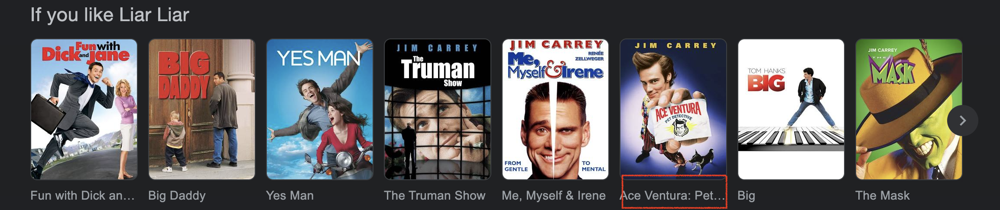

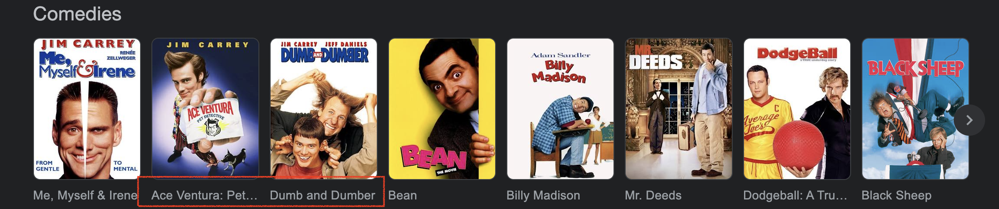

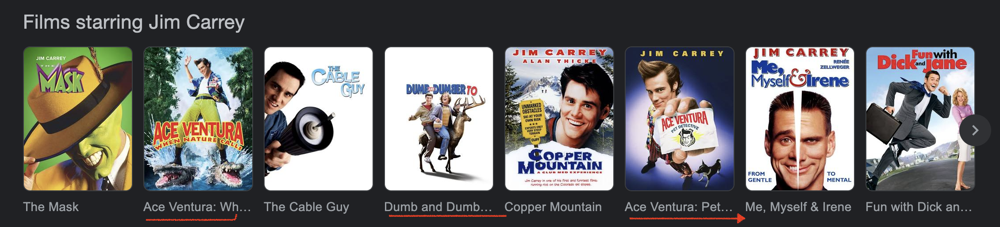

### Matrix Factorization -

First we need to create embeddings for both the user as well as the item or movie. For this We have used the Embedding layer from keras.

Creating embeddings for both users and movies -

In [67]:
users = data.UserID.unique()
movies = data.MovieID.unique()

userid2idx = {o:i for i,o in enumerate(users)}
movieid2idx = {o:i for i,o in enumerate(movies)}

The number of dimensions (Latent Factors) in the embeddings is a hyperparameter to deal with in this implementation of Collaborative Filtering.

In [68]:
data['UserID'] = data['UserID'].apply(lambda x: userid2idx[x])
data['MovieID'] = data['MovieID'].apply(lambda x: movieid2idx[x])
split = np.random.rand(len(data)) < 0.8
train = data[split]
valid = data[~split]
print(train.shape, valid.shape)

(106322, 13) (26355, 13)


In [69]:
n_movies = len(data['MovieID'].unique())
n_users = len(data['UserID'].unique())
n_latent_factors = 64  # Hyperparamter

Specify the input expected to be embedded (Both in user and item embedding). Then use a Embedding layer which expects the number of latent factors in the resulting embedding and also the number of users or items.

In [70]:
user_input = Input(shape=(1, ), name='user_input', dtype='int64')

In [71]:
user_embedding = Embedding(n_users, n_latent_factors, name='user_embedding')(user_input)

In [72]:
user_vec = Flatten(name='FlattenUsers')(user_embedding)

In [73]:
movie_input = Input(shape=(1, ), name='movie_input', dtype='int64')
movie_embedding = Embedding(n_movies, n_latent_factors, name='movie_embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)

Then we take the 'Dot-Product' of both the embeddings using the 'merge' layer. Note that 'dot-product' is just a measure of simalrity and we can use any other mode like 'mulitply' or 'cosine simalarity' or 'concatenate' etc.

In [77]:
sim = dot([user_vec, movie_vec], name='Simalarity-Dot-Product', axes=1)
model = keras.models.Model([user_input, movie_input], sim)

Lastly we make a Keras model from the specified details.

In [104]:
model.compile(optimizer=Adam(learning_rate=1e-4), loss='mse')

Let's see the model's summary -

In [79]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 user_input (InputLayer)     [(None, 1)]                  0         []                            
                                                                                                  
 movie_input (InputLayer)    [(None, 1)]                  0         []                            
                                                                                                  
 user_embedding (Embedding)  (None, 1, 64)                54912     ['user_input[0][0]']          
                                                                                                  
 movie_embedding (Embedding  (None, 1, 64)                213376    ['movie_input[0][0]']         
 )                                                                                            

Note that the metrics used is 'Mean squared Error'. Our aim is to minimize the mse on the training set i.e. over the values which the user has rated.

### Model Training -

In [80]:
model_hist = model.fit([train.UserID, train.MovieID], train.Rating,
                       batch_size=128, epochs=20,
                       validation_data = ([valid.UserID, valid.MovieID], valid.Rating),
                       verbose=1)

Epoch 1/20
831/831 [==============================] - 14s 14ms/step - loss: 10.7874 - val_loss: 2.9350
Epoch 2/20
831/831 [==============================] - 3s 4ms/step - loss: 1.5875 - val_loss: 1.1021
Epoch 3/20
831/831 [==============================] - 3s 4ms/step - loss: 0.9572 - val_loss: 0.9357
Epoch 4/20
831/831 [==============================] - 4s 4ms/step - loss: 0.8480 - val_loss: 0.8915
Epoch 5/20
831/831 [==============================] - 3s 4ms/step - loss: 0.7925 - val_loss: 0.8686
Epoch 6/20
831/831 [==============================] - 3s 3ms/step - loss: 0.7490 - val_loss: 0.8558
Epoch 7/20
831/831 [==============================] - 3s 4ms/step - loss: 0.7099 - val_loss: 0.8476
Epoch 8/20
831/831 [==============================] - 3s 3ms/step - loss: 0.6694 - val_loss: 0.8463
Epoch 9/20
831/831 [==============================] - 4s 5ms/step - loss: 0.6292 - val_loss: 0.8467
Epoch 10/20
831/831 [==============================] - 4s 4ms/step - loss: 0.5863 - val_loss: 0.8

### Model Evaluation -

In [81]:
y_pred = model.predict([valid.UserID, valid.MovieID], verbose=0)
y_pred_class = np.argmax(y_pred, axis=-1)

Calculating the RMSE -

In [82]:
from sklearn.metrics import mean_squared_error
rmse = mean_squared_error(valid.Rating, y_pred, squared=False)
print('Root Mean Squared Error: {:.3f}'.format(rmse))

Root Mean Squared Error: 0.990


Calculating the MAPE -

In [83]:
from sklearn.metrics import mean_absolute_percentage_error
mape =  mean_absolute_percentage_error(valid.Rating, y_pred)
print('Mean Absolute Percentage Error: {:.3f}'.format(mape))

Mean Absolute Percentage Error: 0.284


Plotting the Model Loss -

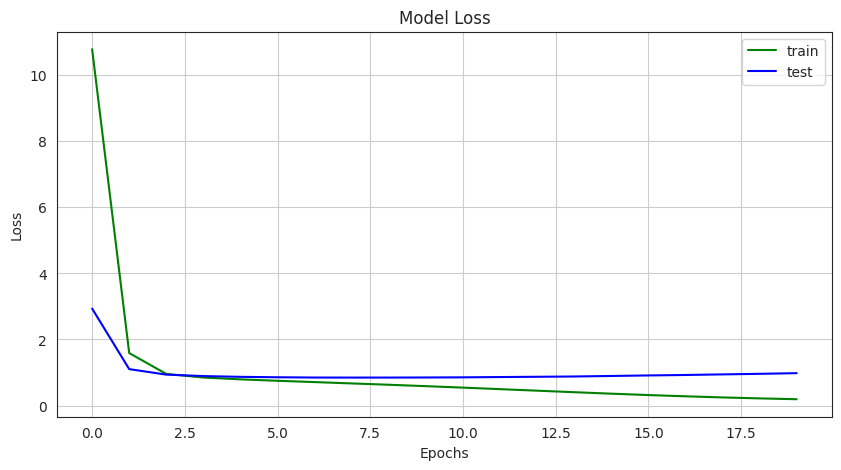

In [84]:
rcParams['figure.figsize'] = 10, 5
plt.plot(model_hist.history['loss'] , 'g')
plt.plot(model_hist.history['val_loss'] , 'b')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'], loc='upper right')
plt.grid(True)
plt.show()

#### **User-based approach: (Optional)**

We've given our user 4 (four) movie names and asked them to rate these movies according to their liking.

In [85]:
mov_name = ['Mrs. Doubtfire', 'Dumb & Dumber', 'Ace Ventura: Pet Detective', 'Home Alone']

In [86]:
mov_id = []
for mov in mov_name:
    id = data[data['Title'] == mov]['MovieID'].iloc[0]
    mov_id.append(id)

In [87]:
mov_rating = list(map(int, input("Rate these movies respectively: ").split()))

Rate these movies respectively: 3 4 5 5


Creating a dataframe for a new user's choices.

In [88]:
user_choices = pd.DataFrame({'MovieID': mov_id,
                            'Title': mov_name,
                            'Rating': mov_rating})
user_choices.sort_values(by='MovieID')

,MovieID,Title,Rating
2,316,Ace Ventura: Pet Detective,5
3,328,Home Alone,5
1,978,Dumb & Dumber,4
0,1009,Mrs. Doubtfire,3


Users who have watched the same movies as the new users.

In [89]:
other_users = data[data['MovieID'].isin(user_choices['MovieID'].values)]
other_users = other_users[['UserID', 'MovieID', 'Rating']]
other_users['UserID'].nunique()

206

Sorting old users by the count of most movies in common with the new user.

In [90]:
common_movies = other_users.groupby(['UserID'])
common_movies = sorted(common_movies, key=lambda x: len(x[1]), reverse=True)
common_movies[0]

(9,
       UserID  MovieID  Rating
 1687       9      978       1
 1705       9      316       1
 1738       9     1009       3
 1749       9      328       2)

In [91]:
top_users = common_movies[:100]

Calculating a Similarity Score for each user using Pearson Correlation function -

In [92]:
pearson_corr = {}

for user_id, movies in top_users:
    movies = movies.sort_values(by='MovieID')
    movie_list = movies['MovieID'].values

    new_user_ratings = user_choices[user_choices['MovieID'].isin(movie_list)]['Rating'].values
    user_ratings = movies[movies['MovieID'].isin(movie_list)]['Rating'].values

    corr = pearsonr(new_user_ratings, user_ratings)
    pearson_corr[user_id] = corr[0]

Get top 10 users with the highest similarity indices.

In [93]:
pearson_df = pd.DataFrame(columns=['UserID', 'Similarity Index'], data=pearson_corr.items())
pearson_df = pearson_df.sort_values(by='Similarity Index', ascending=False)[:10]
pearson_df

,UserID,Similarity Index
70,39,1.00
72,48,1.00
80,115,1.00
84,177,1.00
95,286,1.00
96,336,1.00
47,231,1.00
57,324,0.94
2,72,0.87
27,415,0.87


Get all movies for these users and add weighted movie ratings.

In [94]:
users_rating = pearson_df.merge(data, on='UserID', how='inner')
users_rating['Weighted Rating'] = users_rating['Rating'] * users_rating['Similarity Index']
users_rating = users_rating[['UserID', 'MovieID', 'Rating', 'Similarity Index', 'Weighted Rating']]
users_rating

,UserID,MovieID,Rating,Similarity Index,Weighted Rating
0,39,0,3,1.00,3.00
1,39,844,5,1.00,5.00
2,39,845,4,1.00,4.00
3,39,115,4,1.00,4.00
4,39,116,4,1.00,4.00
...,...,...,...,...,...
4514,415,1144,2,0.87,1.74
4515,415,588,5,0.87,4.35
4516,415,589,4,0.87,3.48
4517,415,1655,2,0.87,1.74


Calculating average recommendation score and selecting items with the highest score.

In [95]:
# Calculate sum of similarity index and weighted rating for each movie
grouped_ratings = users_rating.groupby('MovieID').sum()[['Similarity Index', 'Weighted Rating']]

recommend_movies = pd.DataFrame()

# Add average recommendation score.
# We're calculating average recommendation score by dividing the Weighted Rating by the Similarity Index.
recommend_movies['avg_reccomend_score'] = grouped_ratings['Weighted Rating']/grouped_ratings['Similarity Index']
recommend_movies['MovieID'] = grouped_ratings.index
recommend_movies = recommend_movies.reset_index(drop=True)

# Select movies with the highest score i.e. 5
recommend_movies = recommend_movies[(recommend_movies['avg_reccomend_score'] == 5)]

Let's see 10 movies recommended based on the ratings given by old users who are similar to the new user.

In [96]:
recommendations = data[data['MovieID'].isin(recommend_movies['MovieID'])][['MovieID', 'Title']].sample(10)
recommendations

,MovieID,Title
50558,334,Mystery Science Theater 3000: The Movie
129478,196,Life Is Beautiful (La Vita è bella)
114834,24,To Kill a Mockingbird
54420,577,Romeo and Juliet
102160,1915,"Mission, The"
73635,819,Bringing Out the Dead
128282,217,Anna and the King
19255,453,Soylent Green
62070,1598,Wonder Boys
115533,1025,She's the One


/var/folders/p6/6_nprx9x22s4njm57gzb34l40000gp/T/ipykernel_66147/323488502.py:15: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  pd.value_counts(red_values, normalize=True).sort_index().plot(kind="bar", grid=True)
/var/folders/p6/6_nprx9x22s4njm57gzb34l40000gp/T/ipykernel_66147/323488502.py:15: FutureWarning: value_counts with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  pd.value_counts(red_values, normalize=True).sort_index().plot(kind="bar", grid=True)


<Axes: >

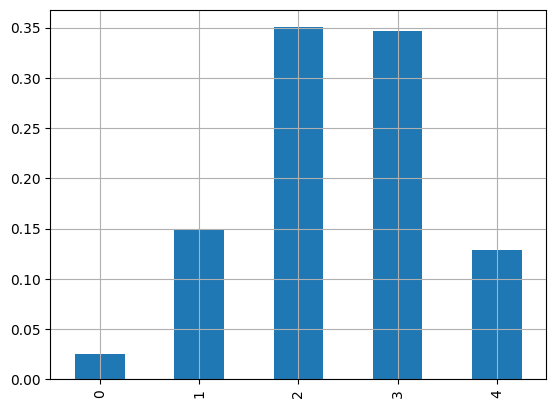

In [15]:
import numpy as np
import pandas as pd

red_values=[]

for person in range(10000):
    rolls=np.random.choice(["R","R","R","B","B"],size=4)
    num_red=np.count_nonzero(rolls=="R")
    red_values.append(num_red)


# pd.value_counts(red_values).plot(kind="bar", grid=True) #plot this as not as count but percentage


pd.value_counts(red_values, normalize=True).sort_index().plot(kind="bar", grid=True)

In [ ]:
1500/